# NLP Recommender System for Trip Advisor: Data Analysis and System Creation


## Table of Contents
---
- [Reading Data](#Reading-Data)
- [Data Cleaning](#Data-Cleaning)
- [Extract Features from Text](#Extract-Features-from-Text)
  - [TF-IDF Vectorization](#TF-IDF-Vectorization)
  - [Count Vectorizer](#Count-Vectorizer)
- [Data Visualization](#Data-Visualization)
  - [Word Clouds](#Word-Clouds)
- [Model Preparation](#Model-Preparation)
- [NLP System](#NLP-System)
  - [K-Means](#K-Means)
  - [DBSCAN](#DBSCAN)
  - [GMM](#GMM)
- [Dimensionality Reduction](#Dimensionality-Reduction)  
  - [PCA](#PCA)
- [Cluster Comparison and Analysis](#Cluster-Comparison-and-Analysis)
- [Discussion and Recommendations](#Discussion-and-Recommendations)

## Helper Functions

## Reading Data

We first import the necessary libraries necessary for data cleaning, modeling, and visualization.

In [1]:
!pip install nltk
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

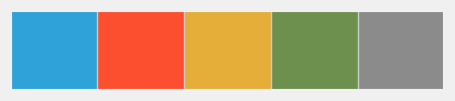

In [17]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')
import seaborn as sns
five_thirty_eight = [
    "#30a2da",
    "#fc4f30",
    "#e5ae38",
    "#6d904f",
    "#8b8b8b",
]
sns.set_palette(five_thirty_eight)
sns.palplot(sns.color_palette())
import plotly.graph_objects as go
import plotly.express as px

import re
from nltk.corpus import stopwords
import string
from nltk.stem import WordNetLemmatizer
from nltk import word_tokenize
from nltk.corpus import stopwords
import nltk

from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.model_selection import train_test_split, GridSearchCV

# For word clouds
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

Next, we pass inside our "things to do from Trip Advisor."

In [3]:
travel_df = pd.read_csv('all_things_to_do.csv')
print('There are {} rows and {} columns in our dataset.'.format(travel_df.shape[0],travel_df.shape[1]))

There are 19198 rows and 2 columns in our dataset.


In [4]:
travel_df.sample(10)

,Places,Place
16883,Negombo Transfer,"Sri Lanka, South Asia"
9818,Kitaoimisaki Park,"Hokkaido, Japan"
8471,"Fresque ""Ponctuation 2.0""","Paris, France"
11834,Hunt For The WellyPeople,"Wellington, New Zealand"
12615,Costa Rica One On One Tours,"Costa Rica, Central America"
9068,Yakumo Shrine,"Hokkaido, Japan"
15498,PASSEIOS MSP TURISMO,"Bahai, Brazil"
13820,Ocean Zen Spa,"Costa Rica, Central America"
3081,Lowenruh park,"Tallinn, Estonia"
5806,Luxembourg Palace,"Paris, France"


In [5]:
travel_df.describe()

,Places,Place
count,19198,19198
unique,18170,15
top,Etreker Travel,"Hokkaido, Japan"
freq,8,3120


We are can that there are `XXX` unique places at various locations. We will now clean our dataset.

## Data Cleaning
Let's first check for null values.

In [6]:
travel_df.isna().sum()

Places    0
Place     0
dtype: int64

There aren't any null values (as we scrapped valid destinations from Trip Advisor). However, we can see that there are a fair amount of locations with duplicated text. We will remove these.

In [7]:
travel_df = travel_df.drop_duplicates()

We then plot the associated cities and the amount of attractions in the respected cities.

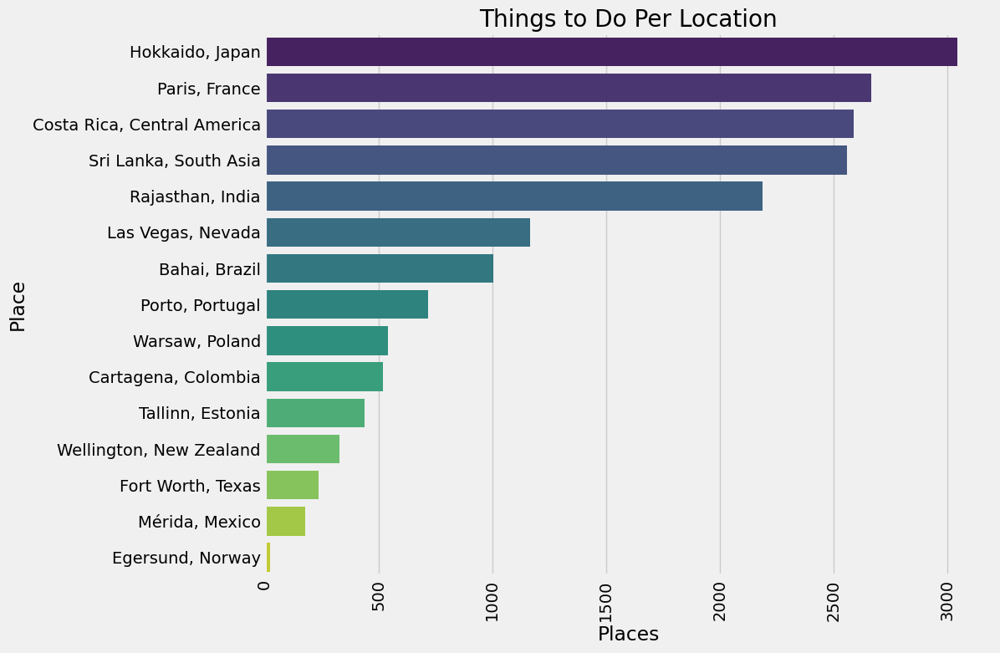

In [8]:
def plot_things_to_do_per_location(travel_df):
    """
    Plot the number of things to do per location using a bar chart.

    Parameters:
    - travel_df (pd.DataFrame): DataFrame containing the travel data.

    Returns:
    None
    """
    # Group by 'Place' and count occurrences
    locations = travel_df.groupby('Place').count()

    # Create a bar plot
    plt.figure(figsize=(10, 8))

    # Sort the locations by the number of places in descending order
    sorted_cities = locations.sort_values(by='Places', ascending=False)

    # Automatically generate a color palette based on the number of unique locations
    num_locations = len(sorted_cities)
    palette = sns.color_palette('viridis', num_locations)

    # Use seaborn barplot with the automatically generated color palette
    sns.barplot(x='Places', y='Place', data=sorted_cities, palette=palette, hue='Place', dodge=False, legend=False)

    # Set plot title and customize axis labels
    plt.title('Things to Do Per Location')
    plt.xticks(rotation=90)

    # Display the plot
    plt.show()


plot_things_to_do_per_location(travel_df)


Next, we will clean the text.

In [9]:
# Download the punkt tokenizer
nltk.download('punkt')

# Download the WordNet resource
nltk.download('wordnet')

def clean_text_column(df, column_name):
    """
    Clean the specified text column in the DataFrame using NLTK for tokenization,
    stopword removal, lemmatization, and punctuation removal.

    Parameters:
    - df (pd.DataFrame): DataFrame containing the text column.
    - column_name (str): Name of the text column to be cleaned.

    Returns:
    None
    """
    # Ensure the specified column exists in the DataFrame
    if column_name not in df.columns:
        print(f"Column '{column_name}' not found in the DataFrame.")
        return

    # Define NLTK objects for stop words and lemmatization
    stop_words_ = set(stopwords.words('english'))
    wn = WordNetLemmatizer()

    def black_txt(token):
        # Check if the token is not a stop word, not a punctuation, and has a length greater than 2
        return token not in stop_words_ and token not in list(string.punctuation) and len(token) > 2

    def clean_txt(text):
        # Remove apostrophes, digits, non-word characters, and replace 'nbsp'
        text = re.sub("'", "", text)
        text = re.sub("(\\d|\\W)+", " ", text)
        text = text.replace("nbsp", "")

        # Tokenize, lemmatize, and filter based on defined conditions
        clean_text = [wn.lemmatize(word, pos="v") for word in word_tokenize(text.lower()) if black_txt(word)]

        return " ".join(clean_text)

    # Apply the cleaning function to the specified column
    df[column_name] = df[column_name].apply(clean_txt)

# Apply the clean text function to the "Things to Do"
clean_text_column(travel_df, 'Places')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [10]:
travel_df.head()

,Places,Place
0,wall city cartagena,"Cartagena, Colombia"
1,castillo san felipe barajas,"Cartagena, Colombia"
2,caribe jewelry museum factory,"Cartagena, Colombia"
3,sanctuary saint peter claver,"Cartagena, Colombia"
4,barrio getsemani,"Cartagena, Colombia"


## Extract Features from Text
Now we will extract features from the Trip Advisor text. The first technique we will use is known as TD-IDF Vectorization.

### TD-IDF Vectorization
We will do the vectorization through the [TfidfVectorizer from Scikit-Learn](https://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.TfidfVectorizer.html).

In [11]:
!pip install nltk
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

TF-IDF ( Term Frequency - Inverse Document Frequency) Vectorization.

In [18]:
#initializing tfidf vectorizer
tfidf_vectorizer = TfidfVectorizer()
tfidf_travel = tfidf_vectorizer.fit_transform((travel_df['Places']))

### Count Vectorizer

Next, we will apply [Count Vectorizer from Scikit-Learn](https://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.CountVectorizer.html).

In [19]:
#initializing count vectorizer
count_vectorizer = CountVectorizer()
count_travel = count_vectorizer.fit_transform((travel_df['Places']))

We will now move to visualize representations of our data.

## Data Visualization
Since our travel locations have thousands of words, let's make word clouds to display common text associated with travel.

### Word Clouds
Next, we will create a function for generating word clouds. We start by creating raw text for all the travel destinations.

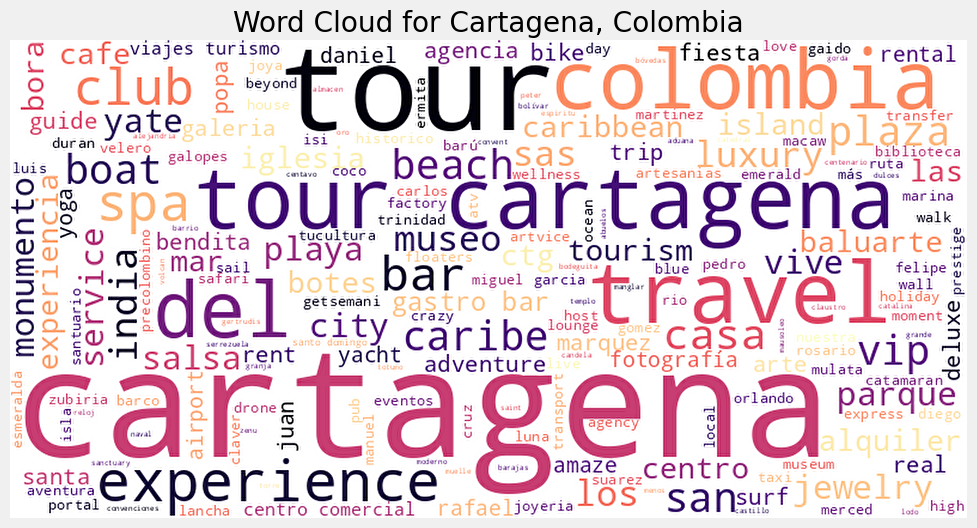

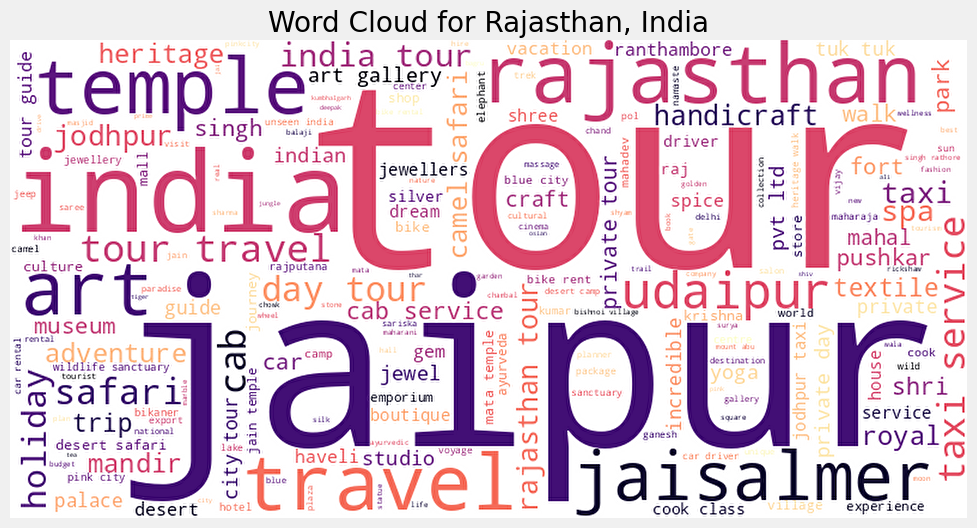

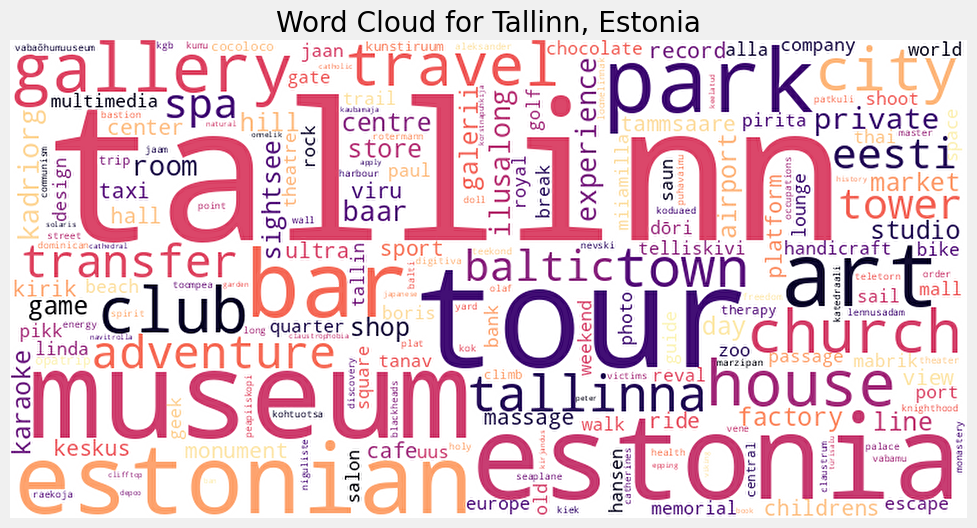

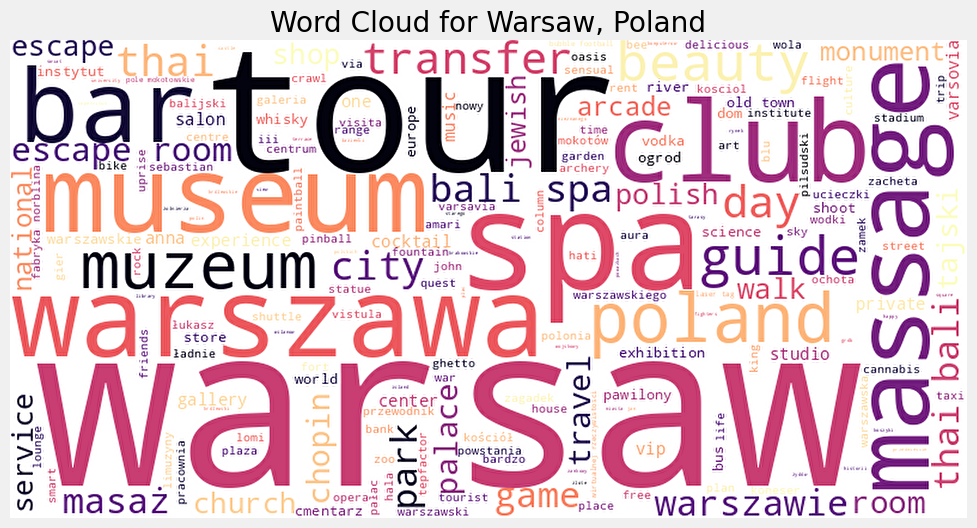

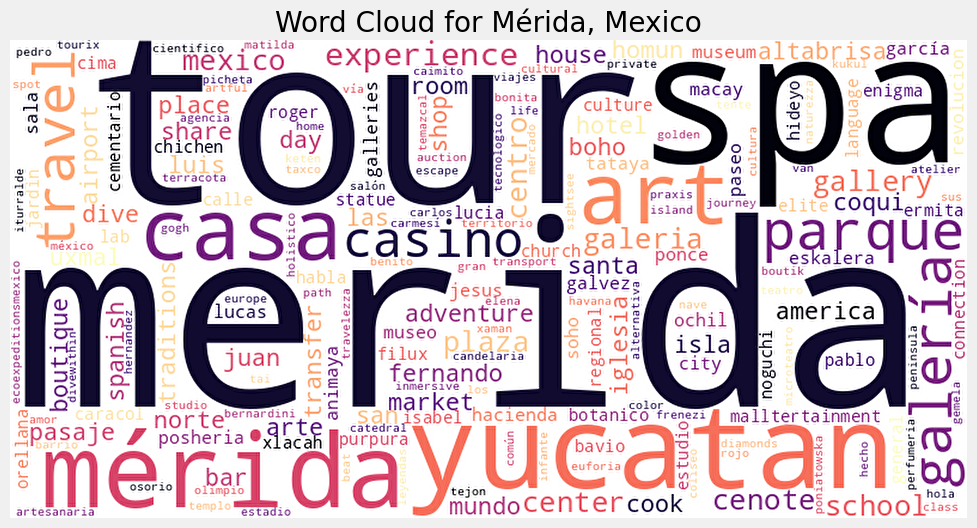

...

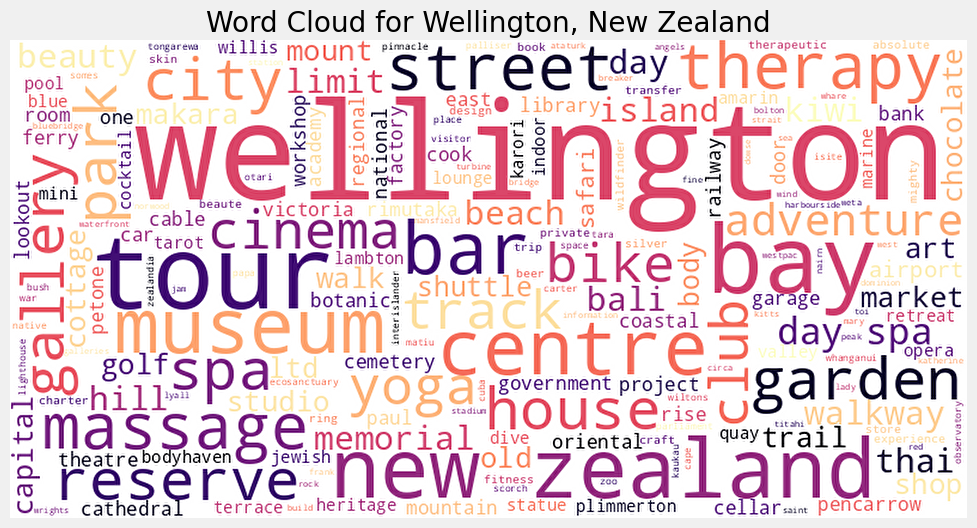

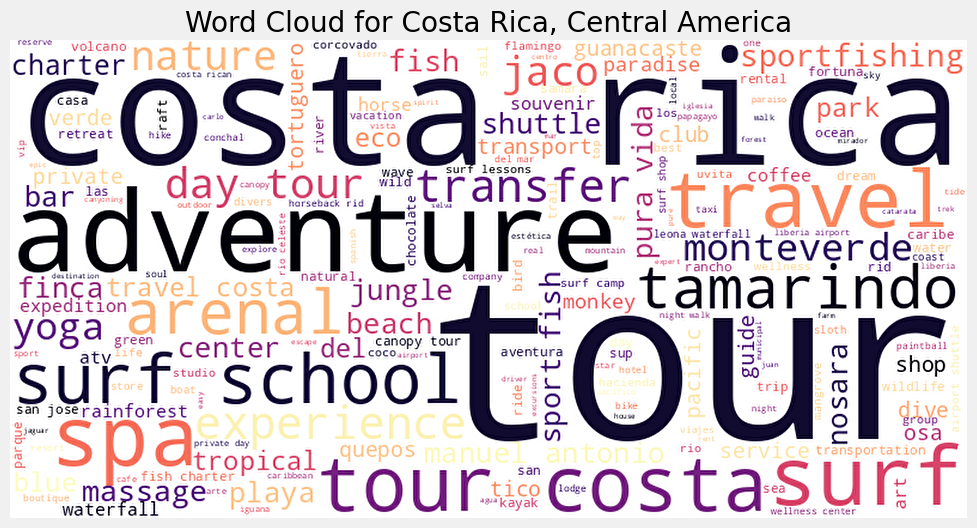

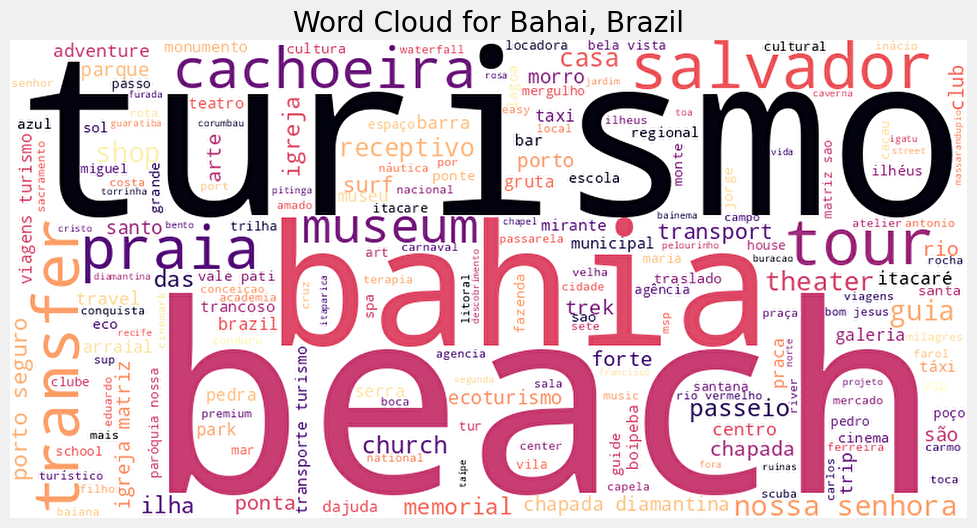

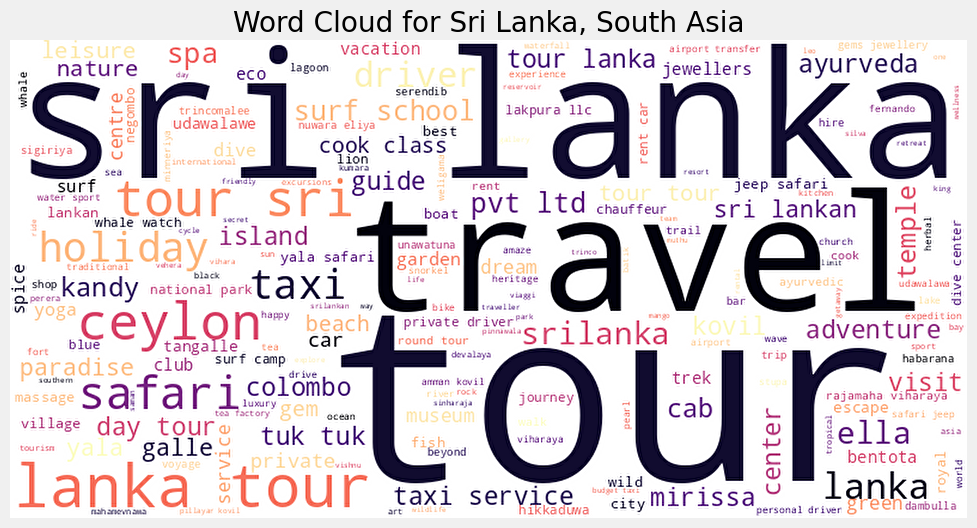

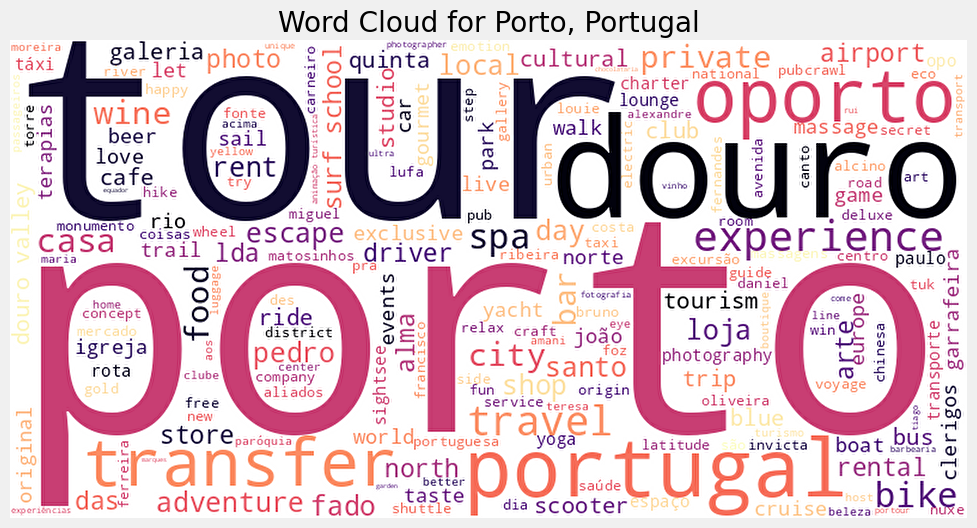

In [14]:
from wordcloud import WordCloud

def generate_wordcloud(data, location):
    """
    Generate and display a word cloud for a specific location in the given data.

    Parameters:
    - data (pd.DataFrame): DataFrame containing the travel data.
    - location (str): Name of the location for which to generate the word cloud.

    Returns:
    None
    """
    # Extract text data for the specified location
    location_text = " ".join(text for text in data[data['Place'] == location]['Places'])

    # Create a WordCloud object
    wordcloud = WordCloud(width=800, height=400, background_color='white', colormap="magma", random_state=42).generate(location_text)

    # Plot the word cloud
    plt.figure(figsize=[11, 11])
    plt.title(f"Word Cloud for {location}")
    plt.imshow(wordcloud, interpolation="sinc")
    plt.axis("off")
    plt.show()
    plt.close()

# Plot word cloud for every location
for location in travel_df['Place'].unique():
    generate_wordcloud(travel_df, location)
    # Print two empty lines
    print("\n\n")

### Pretty Word Clouds: TODO - make them

## Model Preparation

We will now prepare our model. Let's first establish a baseline.

Let's perform our train/test split.

In [26]:
# Perform train/test split before cleaning/preprocessing
baseline_df = pd.read_csv('all_things_to_do.csv')
X = baseline_df['Places']
y = baseline_df['Place']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.25, random_state=123)
X_train.shape, X_test.shape

((14398,), (4800,))

In [27]:
X.head()

0             Walled City of Cartagena
1    Castillo de San Felipe de Barajas
2      Caribe Jewelry Museum & Factory
3      Sanctuary of Saint Peter Claver
4                     Barrio Getsemani
Name: Places, dtype: object

In [32]:
# Clean both

def clean_text_column(series):
    """
    Clean the specified text series using NLTK for tokenization,
    stopword removal, lemmatization, and punctuation removal.

    Parameters:
    - series (pd.Series): Series containing the text data.

    Returns:
    pd.Series: Cleaned text series.
    """
    # Define NLTK objects for stop words and lemmatization
    stop_words_ = set(stopwords.words('english'))
    wn = WordNetLemmatizer()

    def black_txt(token):
        # Check if the token is not a stop word, not a punctuation, and has a length greater than 2
        return token not in stop_words_ and token not in list(string.punctuation) and len(token) > 2

    def clean_txt(text):
        # Remove apostrophes, digits, non-word characters, and replace 'nbsp'
        text = re.sub("'", "", text)
        text = re.sub("(\\d|\\W)+", " ", text)
        text = text.replace("nbsp", "")

        # Tokenize, lemmatize, and filter based on defined conditions
        clean_text = [wn.lemmatize(word, pos="v") for word in word_tokenize(text.lower()) if black_txt(word)]

        return " ".join(clean_text)

    # Apply the cleaning function to the specified series
    cleaned_series = series.apply(clean_txt)

    return cleaned_series

X_train = clean_text_column(X_train)
X_test = clean_text_column(X_test)

In [33]:
# vectorize
tfidf_vectorizer = TfidfVectorizer()
X_train_baseline = tfidf_vectorizer.fit_transform(X_train)
X_test_baseline = tfidf_vectorizer.fit_transform(X_test)

In [34]:
def plot_conf_matrix(y_true, y_pred):

    """
    Plots a confusion matrix and displays classification report.
    """

    cm = confusion_matrix(y_true, y_pred, normalize='true')
    plt.figure(figsize=(15, 15))
    sns.heatmap(cm, annot=True, cmap='Blues', fmt='0.2g', annot_kws={"size": 14},
                xticklabels=nb.classes_, yticklabels=nb.classes_, square=True)
    plt.xlabel('Predictions')
    plt.ylabel('Actuals')
    plt.show()

In [35]:
def evaluate_model(model, X_train, X_test):
    y_preds_train = model.predict(X_train.todense())
    y_preds_test = model.predict(X_test.todense())

    print('Training Accuracy:', accuracy_score(y_train, y_preds_train))
    print('Testing Accuracy:', accuracy_score(y_test, y_preds_test))
    print('\n---------------\n')
    print('Training F1:', f1_score(y_train, y_preds_train, average='weighted'))
    print('Testing F1:', f1_score(y_test, y_preds_test, average='weighted'))
    print('\n---------------\n')
    print('Train Confusion Matrix\n')
    plot_conf_matrix(y_train, y_preds_train)
    print('Test Confusion Matrix\n')
    plot_conf_matrix(y_test, y_preds_test)
    print('\n----------------\n')
    print(classification_report(y_test, y_preds_test))

In [36]:
nb = MultinomialNB()
nb.fit(X_train_tfidf.todense(), y_train)

NameError: name 'MultinomialNB' is not defined